# Aula 02

![](../../data/imagem/banner-pos-2022.jpg)

-----------

# Importando Bibliotecas

In [1]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [2]:
PATH_DIR = '../../data'

sorted(os.listdir(PATH_DIR))

['coil-100',
 'coil-100.zip',
 'comprimidos.jpg',
 'comprimidos_2.jpg',
 'dataset.zip',
 'dataset2.zip',
 'foto_de_frutas.jpg',
 'imagem',
 'video']

# Transformações Geometricas

As transformações geométricas são operações que modificam a posição, escala, orientação ou perspectiva de uma imagem. No OpenCV, essas transformações são realizadas principalmente por duas funções:

* `cv2.warpAffine()`: 
    * Usa uma matriz de transformação 2×3 para realizar translações, rotações e transformações afins.
* `cv2.warpPerspective()`: 
    * Usa uma matriz de transformação 3×3 para realizar transformações de perspectiva.

As fórmulas dessas transformações são:

* Transformação Afim (`cv2.warpAffine()`):
    * Equation 1

* Transformação de Perspectiva (`cv2.warpPerspective()`):
    * Equation 2

-----------------    

## Redimensionamento de Imagens (Scaling)

O redimensionamento altera o tamanho da imagem, aumentando ou reduzindo suas dimensões. Isso é feito com a função `cv2.resize()`.

* Redimensionamento para um tamanho específico
```python
img_resize = cv2.resize(img, (largura*2, altura*2), interpolation=cv2.INTER_LINEAR)
```
* Redimensionamento proporcional (fatores fx e fy)
```python
img_resize = cv2.resize(img, None, fx=0.5, fy=0.5, interpolation=cv2.INTER_AREA)
```

**Métodos de Interpolação**

O OpenCV oferece diferentes métodos para interpolação ao redimensionar imagens.

* `cv2.INTER_NEAREST` → Vizinho mais próximo (mais rápido, menor qualidade)
* `cv2.INTER_LINEAR` → Bilinear (padrão para redução).
* `cv2.INTER_AREA` → Aproximação por área (melhor para reduzir imagens).
* `cv2.INTER_CUBIC` → Bicúbica (melhor para aumentar imagens, mais lento).
* `cv2.INTER_LANCZOS4` → Interpolação senoidal (alta qualidade, mais lento).

**Recomendçação**
* Para aumentar a imagem → cv2.INTER_CUBIC ou cv2.INTER_LINEAR
* Para reduzir a imagem → cv2.INTER_AREA



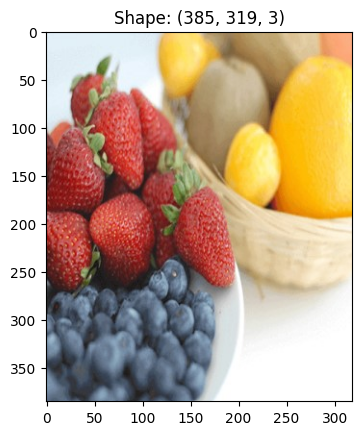

In [12]:
img_path = os.path.join(PATH_DIR, 'imagem', 'imagem_frutas.jpg')

img = cv2.imread(img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.imshow(img)
plt.title(f"Shape: {img.shape}")
plt.show()

In [13]:
largura = img.shape[1]
altura = img.shape[0]

print('Imagem Original')
print(f"Largura: {largura}")
print(f"Altura: {altura}")

img_resize = cv2.resize(img, (img.shape[1]*2, img.shape[0]*2), interpolation=cv2.INTER_LINEAR)

print('\nImagem Redimensionada')
print(f"Largura: {img_resize.shape[1]}")
print(f"Altura: {img_resize.shape[0]}")

assert img_resize.shape == (altura*2, largura*2, 3)

Imagem Original
Largura: 319
Altura: 385

Imagem Redimensionada
Largura: 638
Altura: 770


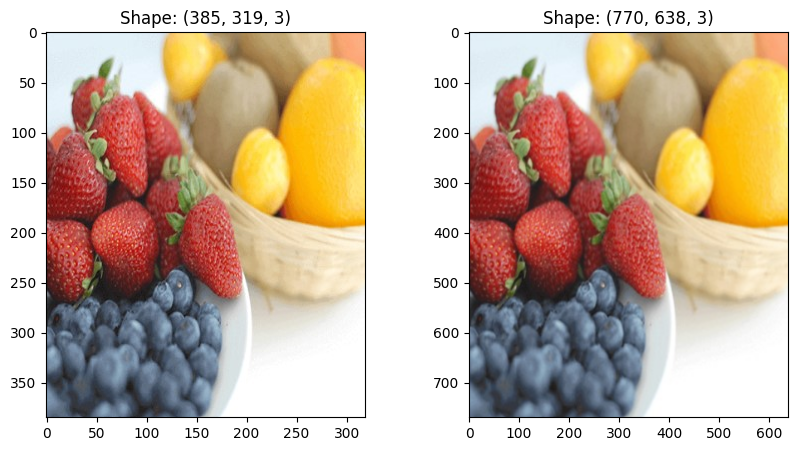

In [14]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(img)
ax[0].set_title(f"Shape: {img.shape}")
ax[1].imshow(img_resize)
ax[1].set_title(f"Shape: {img_resize.shape}")
plt.show()

In [15]:
largura = img.shape[1]
altura = img.shape[0]
fator = 20

print('Imagem Original')
print(f"Largura: {largura}")
print(f"Altura: {altura}")

img_resize = cv2.resize(img, None, fx=fator, fy=fator, interpolation=cv2.INTER_LINEAR)

print('\nImagem Redimensionada')
print(f"Largura: {img_resize.shape[1]}")
print(f"Altura: {img_resize.shape[0]}")

assert img_resize.shape == (altura*fator, largura*fator, 3)

Imagem Original
Largura: 319
Altura: 385

Imagem Redimensionada
Largura: 6380
Altura: 7700


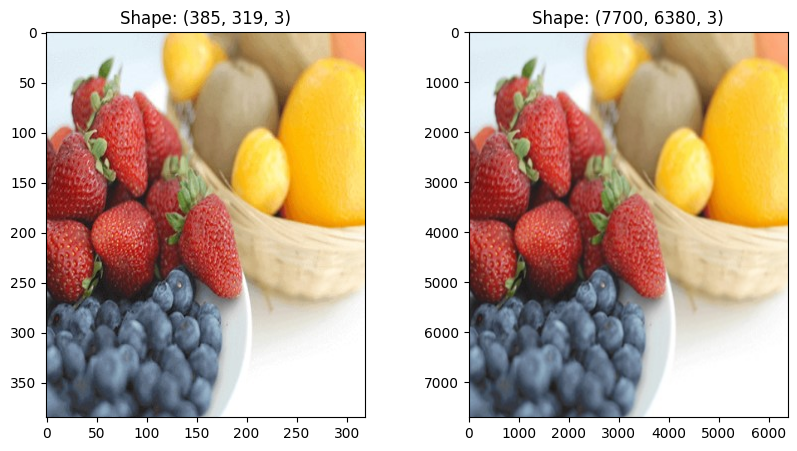

In [16]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(img)
ax[0].set_title(f"Shape: {img.shape}")
ax[1].imshow(img_resize)
ax[1].set_title(f"Shape: {img_resize.shape}")
plt.show()

## Translação de Imagem (Translation)

A translação desloca a imagem em uma direção específica (horizontal ou vertical). Isso é feito multiplicando a imagem por uma matriz de translação M.


$$
M = \begin{bmatrix}
1 & 0 & t_x \\
0 & 1 & t_y
\end{bmatrix}
$$

onde:
* $t_x$ é o deslocamento horizontal
* $t_y$ é o deslocamento vertical

**Criando a matriz de translação**

Podemos criar a matriz `M` usando `Numpy`
```python
M = np.float32([[1, 0, tx], [0, 1, ty]])
```

e depois aplicarmos a translação com `cv2.warpAffine()`
```pyhton
dst_image = cv2.warpAffine(image, M, (largura, altura))
```

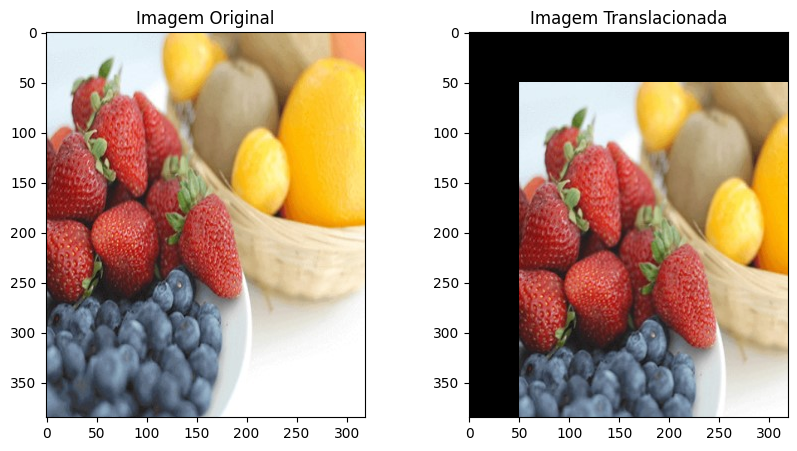

In [17]:
tx = 50
ty = 50

M = np.float32([[1, 0, tx], [0, 1, ty]])
img_translacao = cv2.warpAffine(img, M, (img.shape[1], img.shape[0]))

fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(img)
ax[0].set_title(f"Imagem Original")
ax[1].imshow(img_translacao)
ax[1].set_title(f"Imagem Translacionada")
plt.show()

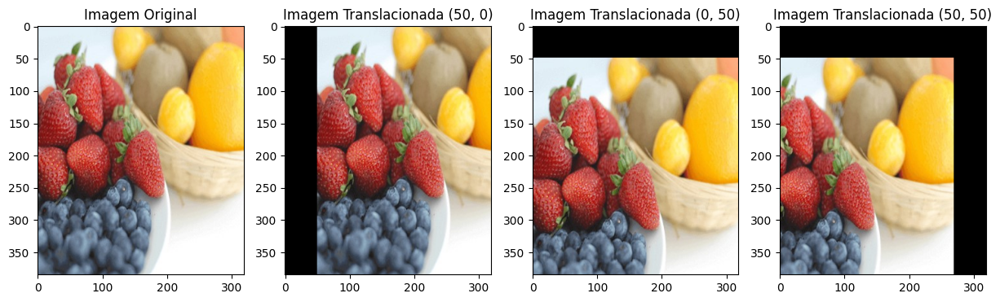

In [18]:
def translacao(img, tx, ty):
    M = np.float32([[1, 0, tx], [0, 1, ty]])
    img_translacao = cv2.warpAffine(img, M, (img.shape[1], img.shape[0]))
    return img_translacao

fig, ax = plt.subplots(1, 4, figsize=(15, 5))
ax[0].imshow(img)
ax[0].set_title(f"Imagem Original")
ax[1].imshow(translacao(img, 50, 0))
ax[1].set_title(f"Imagem Translacionada (50, 0)")
ax[2].imshow(translacao(img, 0, 50))
ax[2].set_title(f"Imagem Translacionada (0, 50)")
ax[3].imshow(translacao(img, -50, 50))
ax[3].set_title(f"Imagem Translacionada (50, 50)")
plt.show()


## Rotação de Imagens

A rotação da uma imagem é feita utilizando a função cv2.getRotationMatrix2D(), que gera uma matriz 2×3 de transformação. Essa matriz define o ângulo de rotação (em graus), o ponto central da rotação e um fator de escala.

* Ângulos positivos → Rotação anti-horária
* Ângulos negativos → Rotação horária

**Exemplo: Rotacionando uma imagem em 180º sem alterar a escala**

```python
height, width = image.shape[:2]
M = cv2.getRotationMatrix2D((width/2, height/2), 180, 1)
img_rotacionada = cv2.warpAffine(img, M, (width, height))
```

A matriz M define a rotação em torno do centro da imagem com um fator de escala 1 (sem redimensionamento). A transformação é então aplicada com `cv2.warpAffine()`.

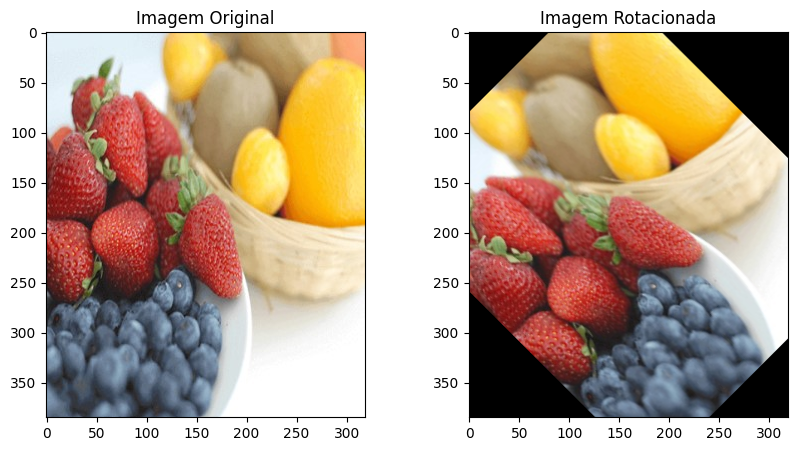

In [19]:
height, width = img.shape[:2]
angle = 45
M = cv2.getRotationMatrix2D((width/2, height/2), angle, 1)
img_rotacionada = cv2.warpAffine(img, M, (width, height))

fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(img)
ax[0].set_title(f"Imagem Original")
ax[1].imshow(img_rotacionada)
ax[1].set_title(f"Imagem Rotacionada")
plt.show()

## Transformação Afim (Affine Transformation)

Uma transformação afim altera a imagem mantendo linhas retas e paralelas intactas, mas não preserva ângulos e distâncias.

A matriz de transformação 2×3 é gerada pela função `cv2.getAffineTransform()`, a partir de três pontos de referência na imagem original e seus respectivos novos locais na imagem transformada.

**Exemplo:**

```python
pts_1 = np.float32([[50, 150], [50, 300], [270, 50]])
pts_2 = np.float32([[50, 160], [50, 300], [270, 50]])

M = cv2.getAffineTransform(pts_1, pts_2)
img_affine = cv2.warpAffine(img, M, (img.shape[1], img.shape[0]))
```

Aqui, três pontos da imagem original (pts_1) são mapeados para novos pontos (pts_2), gerando a matriz M, que é então aplicada à imagem.


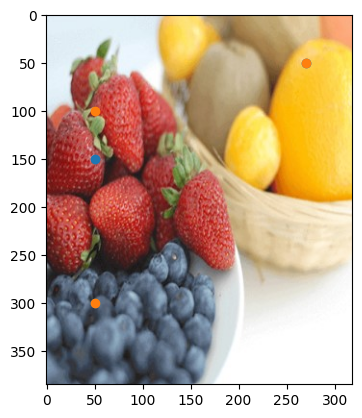

In [21]:
plt.imshow(img)
plt.scatter([50, 50, 270], [150, 300, 50])
plt.scatter([50, 50, 270], [100, 300, 50])
plt.show()

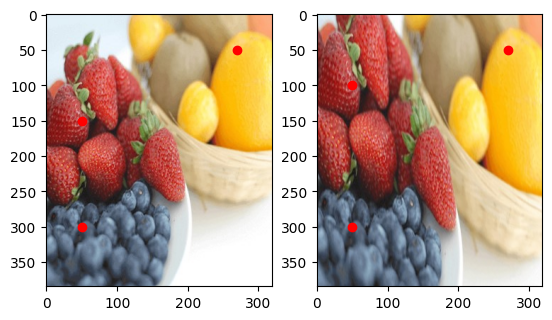

In [25]:
# [50, 50, 270], [150, 300, 50]
pts_1 = np.float32([[50, 150], [50, 300], [270, 50]])
pts_2 = np.float32([[50, 100], [50, 300], [270, 50]])

M = cv2.getAffineTransform(pts_1, pts_2)
img_affine = cv2.warpAffine(img, M, (img.shape[1], img.shape[0]))

plt.subplot(1, 2, 1)
plt.imshow(img)
plt.scatter([50, 50, 270], [150, 300, 50], c='red')
plt.subplot(1, 2, 2)
plt.imshow(img_affine)
plt.scatter([50, 50, 270], [100, 300, 50], c='red')
plt.show()

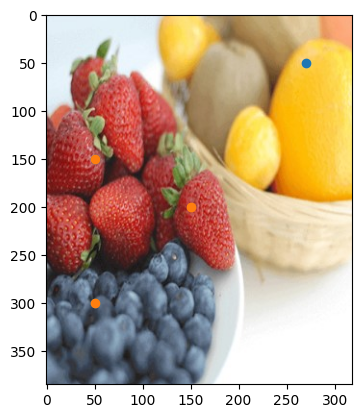

In [28]:
plt.imshow(img)
plt.scatter([50, 50, 270], [150, 300, 50])
plt.scatter([50, 50, 150], [150, 300, 200])
plt.show()

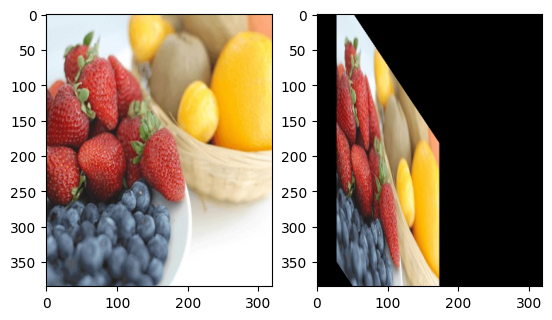

In [29]:
# [50, 50, 270], [150, 300, 50]
pts_1 = np.float32([[50, 150], [50, 300], [270, 50]])
pts_2 = np.float32([[50, 150], [50, 300], [150, 200]])

M = cv2.getAffineTransform(pts_1, pts_2)
img_affine = cv2.warpAffine(img, M, (img.shape[1], img.shape[0]))

plt.subplot(1, 2, 1)
plt.imshow(img)
plt.subplot(1, 2, 2)
plt.imshow(img_affine)
plt.show()

## Transformação de perspectiva

O posicionamento incorreto, a lente ou até mesmo o balanço da câmera podem interferir na perspectiva da
fotografia, causando inclinação ou distorção do objeto representado na imagem. Em fotografias que possuem
linhas horizontais, verticais ou formas geométricas, as distorções tornam-se ainda mais perceptíveis.


Para corrigir as distorções de perspectiva, podemos usar a função warpPerspective da biblioteca OpenCV. Ela ajusta a perspectiva de uma imagem tendo como referência uma matriz predefinida de pontos, gerada pela função `getPerspectiveTransform`.

A fim de facilitar o entendimento, observe a figura a seguir: a imagem à esquerda apresenta uma fotografia com distorções. Nela, as arestas do quadrado que representa o jogo foram definidas como pontos iniciais para o ajuste. A fotografia à direita apresenta a nova imagem gerada após o ajuste ser processado. Repare que os pontos iniciais, definidos à esquerda, tornaram-se as arestas da nova imagem gerada após o processamento.

Link: https://theailearner.com/tag/cv2-getperspectivetransform/ 

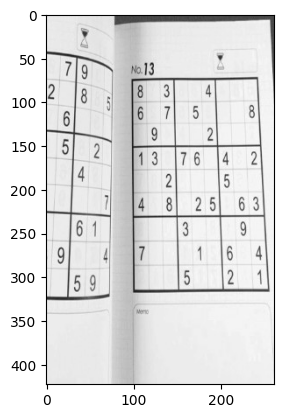

In [30]:
img_path = os.path.join(PATH_DIR, 'imagem', 'sudoku.jpg')

img = cv2.imread(img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.imshow(img)
plt.show()

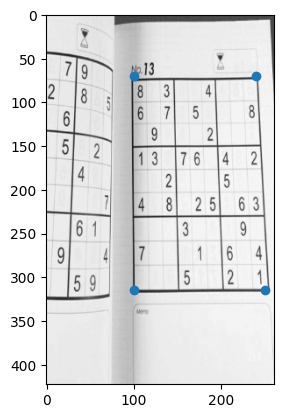

In [31]:
plt.imshow(img)
plt.scatter([100, 240, 100, 250], [70, 70, 315, 315])
plt.show()

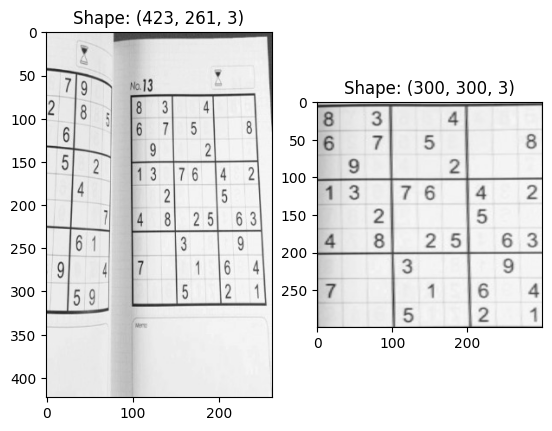

In [34]:
pts_1 = np.float32(
    [[100, 70], [240, 70], [100, 315], [250, 315]]
)
pts_2 = np.float32(
    [[0, 0], [300, 0], [0, 300], [300, 300]]
)

M = cv2.getPerspectiveTransform(pts_1, pts_2)
img_affine = cv2.warpPerspective(img, M, (300, 300))

plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title(f'Shape: {img.shape}')
plt.subplot(1, 2, 2)
plt.imshow(img_affine)
plt.title(f'Shape: {img_affine.shape}')
plt.show()

# Operações Aritméticas em imagens

* Permitem combinar ou modificar imagens por meio de soma, subtração, multiplicação e divisão de pixels.
* Para operações como adição e mistura, as imagens devem ter a mesma dimensão e tipo (ex.: 8 bits).
* Os valores de pixel variam de 0 a 255, o que pode causar overflow ao ultrapassar esses limites.


## Aritmética de Saturação

* Tipo de operação aritmética em que os valores resultantes são limitados a um intervalo fixo, evitando que saiam desse intervalo.
* No caso de uma imagem de 8 bits, os valores de pixel variam de 0 a 255.
* Para armazenar um valor de r (resultado de uma operação), aplica-se a equação:

$$
I(x, y) = min( max( round(r), 0 ), 255 )
$$

onde:
* round(r) arredonda o valor de r.
* max( round(r), 0 ) garante que o valor mínimo não seja menor que 0.
* min(..., 255) garante que o valor máximo não ultrapasse 255.


In [40]:
x = np.uint8([[250]])
y = np.uint8([[50]])

result_opencv = cv2.add(x, y)
result_numpy = x + y

print("OpenCV")
print("cv2.add(x:'{}' , y:'{}') = '{}'".format(x, y, result_opencv))
print("Numpy")
print("x:'{}' + y:'{}' = '{}'".format(x, y, result_numpy))

OpenCV
cv2.add(x:'[[250]]' , y:'[[50]]') = '[[255]]'
Numpy
x:'[[250]]' + y:'[[50]]' = '[[44]]'


**NumPy (x + y) → Aritmética Modular (Wrap-Around)**

* O NumPy usa aritmética modular quando ocorre overflow em tipos inteiros (uint8).
* uint8 armazena valores entre 0 e 255.
* Se o resultado ultrapassar 255, ele "dá a volta":
    * Exemplo:
    ```python 
    250 (uint8) + 50 (uint8) = 300  
    300 % 256 = 44 → Resultado: [44]
    ``` 

**OpenCV (cv2.add(x, y)) → Saturação (Clipping)**

* O OpenCV, por padrão, satura os valores em vez de fazer wrap-around.
    * Valores acima de 255 são truncados para 255.
    * Valores abaixo de 0 são truncados para 0.
* Resultado esperado:
    ```python
    250 + 50 = 300 → 300 > 255 → Resultado: [255]
    ``` 

## Operação de Adição

* Soma os valores dos pixels de duas imagens, resultando em uma nova imagem.
* Pode causar saturação de pixels, tornando regiões muito claras ou distorcidas.
* Pode ser usada para ajustar o brilho e contraste ao adicionar valores constantes.

**Exemplos:**
```python
# Somando duas Imagens
img_add = cv2.add(img_1, img_2)

# Somando uma imagem com um escalar
img_add = cv2.add(img, 40)
```

In [43]:
img_path_1 = os.path.join(PATH_DIR, 'imagem', 'fichas_vermelhas.png')
img_path_2 = os.path.join(PATH_DIR, 'imagem', 'fichas_pretas.png')

img_1 = cv2.imread(img_path_1)
img_2 = cv2.imread(img_path_2)

img_1 = cv2.cvtColor(img_1, cv2.COLOR_BGR2RGB)
img_2 = cv2.cvtColor(img_2, cv2.COLOR_BGR2RGB)

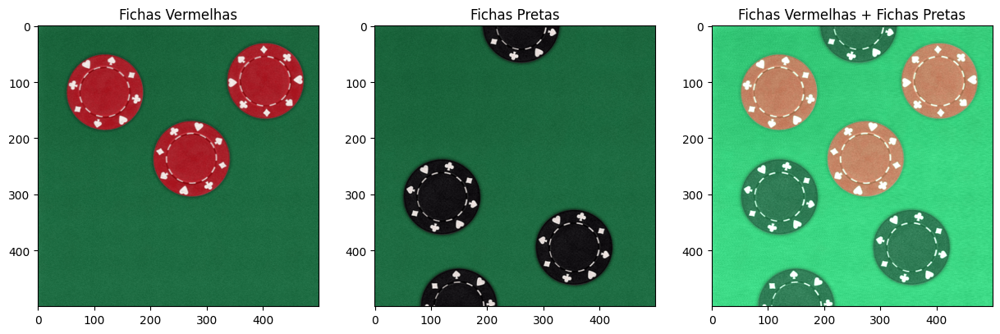

In [44]:
result_add = cv2.add(img_1, img_2)

plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.imshow(img_1)
plt.title('Fichas Vermelhas')
plt.subplot(1, 3, 2)
plt.imshow(img_2)
plt.title('Fichas Pretas')
plt.subplot(1, 3, 3)
plt.imshow(result_add)
plt.title('Fichas Vermelhas + Fichas Pretas')
plt.show()

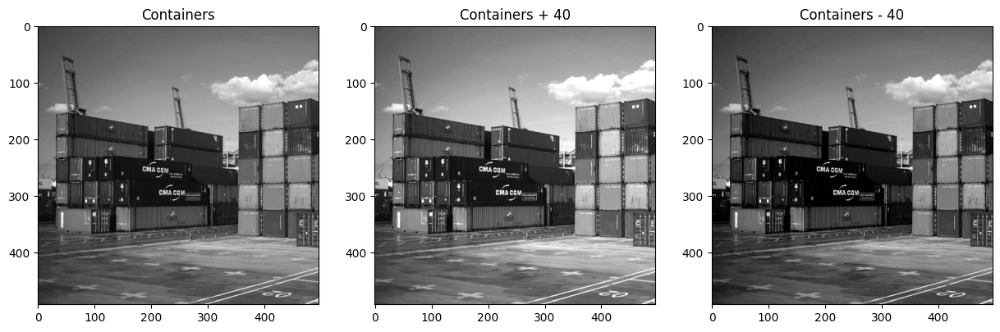

In [45]:
img_path = os.path.join(PATH_DIR, 'imagem', 'containers.png')
img = cv2.imread(img_path, 0)

img_clara = cv2.add(img, 40)
img_escura = cv2.add(img, -40)

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(img, cmap='gray')
plt.title('Containers')

plt.subplot(1, 3, 2)
plt.imshow(img_clara, cmap='gray')
plt.title('Containers + 40')

plt.subplot(1, 3, 3)
plt.imshow(img_escura, cmap='gray')
plt.title('Containers - 40')

plt.show()

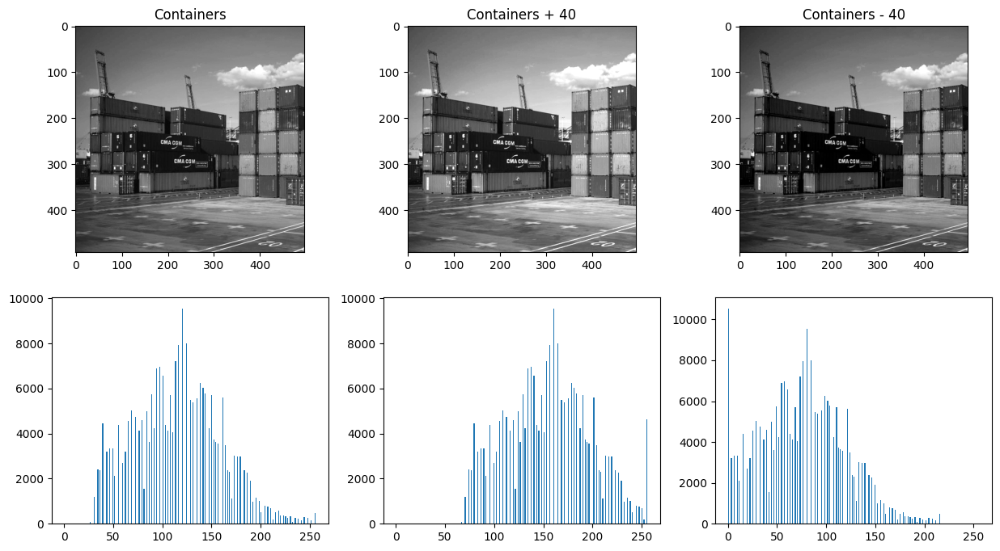

In [46]:
plt.figure(figsize=(15, 8))

plt.subplot(2, 3, 1)
plt.imshow(img, cmap='gray')
plt.title('Containers')

plt.subplot(2, 3, 2)
plt.imshow(img_clara, cmap='gray')
plt.title('Containers + 40')

plt.subplot(2, 3, 3)
plt.imshow(img_escura, cmap='gray')
plt.title('Containers - 40')

plt.subplot(2, 3, 4)
plt.hist(img.ravel(), bins=256, range=(0, 256))

plt.subplot(2, 3, 5)
plt.hist(img_clara.ravel(), bins=256, range=(0, 256))

plt.subplot(2, 3, 6)
plt.hist(img_escura.ravel(), bins=256, range=(0, 256))

plt.show()

## Operação de Subtração

* Destaca as diferenças entre duas imagens, útil para detectar movimentos e mudanças.
* Aplicável em processamento de vídeo para rastreamento de objetos.
* Pode ser combinada com binarização para segmentar objetos em movimento.

**Exemplo de código:**
```python
img_sub = cv2.subtract(img_1, img_2)
```

In [6]:
img1_path = os.path.join(PATH_DIR, 'imagem', "captura_de_movimento_1.png")
img1 = cv2.imread(img1_path)
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)

img2_path = os.path.join(PATH_DIR, 'imagem', "captura_de_movimento_2.png")
img2 = cv2.imread(img2_path)[:, :-2, :]
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

img1.shape == img2.shape

True

In [9]:
img_sub = cv2.subtract(img2, img1)

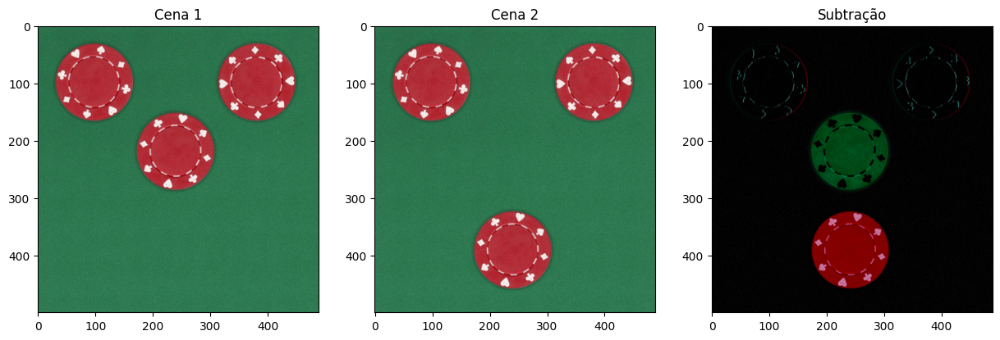

In [10]:
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(img1)
plt.title('Cena 1')

plt.subplot(1, 3, 2)
plt.imshow(img2)
plt.title('Cena 2')

plt.subplot(1, 3, 3)
plt.imshow(img_sub)
plt.title('Subtração')

plt.show()

## Operação de Mistura

* Combina duas imagens com pesos diferentes, criando um efeito de transparência ou fusão.
* São 5 parâmetros obrigatórios:
    * src1 e src2: imagens a serem combinadas.
    * alpha e beta: pesos das imagens (valores entre 0.0 e 1.0).
    * gamma: ajuste opcional de brilho.

```python
img = cv2.addWeighted(src1, alpha, src2, beta, gamma)
```


In [11]:
img1_path = os.path.join(PATH_DIR, 'imagem', "grupo_de_pessoas_sorrindo.jpg")
img1 = cv2.imread(img1_path)
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)

img2_path = os.path.join(PATH_DIR, 'imagem', "image_capturada_drone.png")
img2 = cv2.imread(img2_path)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

img1.shape, img2.shape

((664, 996, 3), (1024, 688, 3))

In [13]:
img2 = cv2.resize(img2, (996, 664))
img1.shape == img2.shape

True

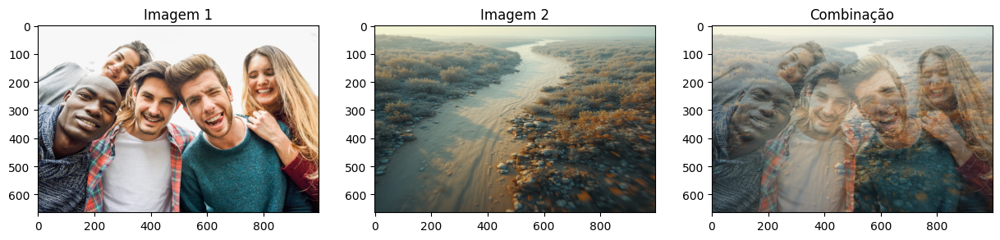

In [15]:
img_comb = cv2.addWeighted(img1, 0.4, img2, 0.6, 0)

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(img1)
plt.title('Imagem 1')

plt.subplot(1, 3, 2)
plt.imshow(img2)
plt.title('Imagem 2')

plt.subplot(1, 3, 3)
plt.imshow(img_comb)
plt.title('Combinação')

plt.show()

## Operação bit a bit (Bitwise)

* Operações bit a bit são operações realizadas diretamente nos bits que compõem os valores dos pixels de uma imagem, permitindo manipulações rápidas e eficientes.
* OpenCV fornece quatro operações principais de manipulação bit a bit: AND, OR, XOR e NOT.

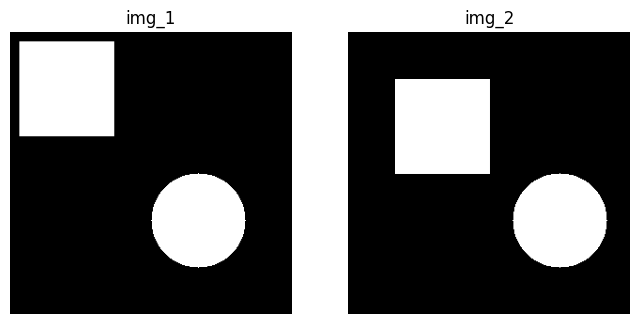

In [53]:
# Criando a primeira imagem
img_1 = np.zeros((300, 300), dtype="uint8")
cv2.rectangle(img_1, (10, 10), (110, 110), (255, 255, 255), -1)
cv2.circle(img_1, (200, 200), 50, (255, 255, 255), -1)

# Criando a segunda imagem
img_2 = np.zeros((300, 300), dtype="uint8")
cv2.rectangle(img_2, (50, 50), (150, 150), (255, 255, 255), -1)
cv2.circle(img_2, (225, 200), 50, (255, 255, 255), -1)

# Exibindo as imagens
plt.figure(figsize=(8, 5))

plt.subplot(1, 2, 1)
plt.imshow(img_1, cmap='gray')
plt.title('img_1')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(img_2, cmap='gray')
plt.title('img_2')
plt.axis('off')

plt.show()

### Bitwise AND (`cv2.bitwise_and(img_1, img_2)`)

* Retorna 1 apenas onde ambos os bits correspondentes nas imagens de entrada são 1. 
* Útil para mascarar regiões de interesse, permitindo que apenas os pixels compartilhados entre as duas imagens sejam mantidos.



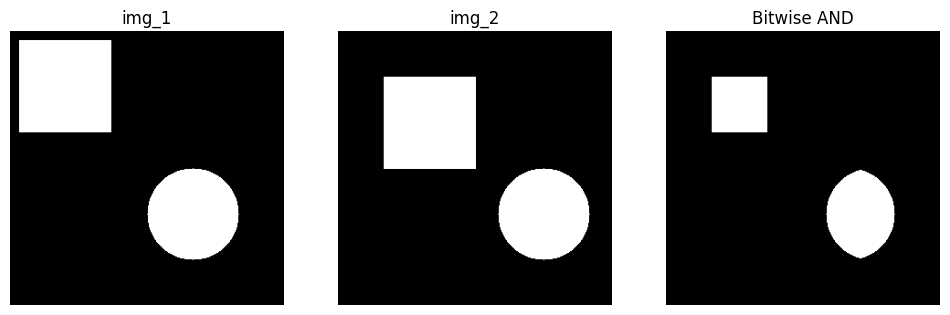

In [55]:
bitwise_and = cv2.bitwise_and(img_1, img_2)

# Exibindo as imagens
plt.figure(figsize=(12, 5))

plt.subplot(1, 3, 1)
plt.imshow(img_1, cmap='gray')
plt.title('img_1')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(img_2, cmap='gray')
plt.title('img_2')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(bitwise_and, cmap='gray')
plt.title('Bitwise AND')
plt.axis('off')

plt.show()

### Bitwise OR (`cv2.bitwise_or(img_1, img_2)`)

* Retorna 1 onde pelo menos um dos bits correspondentes nas imagens de entrada são 1. 
* Útil para combinar imagens ou máscaras.


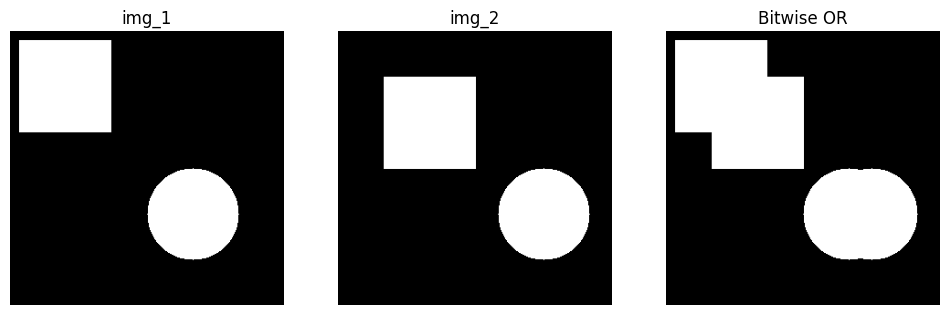

In [56]:
bitwise_or = cv2.bitwise_or(img_1, img_2)

# Exibindo as imagens
plt.figure(figsize=(12, 5))

plt.subplot(1, 3, 1)
plt.imshow(img_1, cmap='gray')
plt.title('img_1')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(img_2, cmap='gray')
plt.title('img_2')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(bitwise_or, cmap='gray')
plt.title('Bitwise OR')
plt.axis('off')

plt.show()

### Bitwise XOR (`cv2.bitwise_xor(img_1, img_2)`)

* Retorna 1 onde os bits correspondentes nas imagens de entrada são diferentes (um é 1 e o outro é 0). 
* Útil para detectar diferenças entre duas imagens.


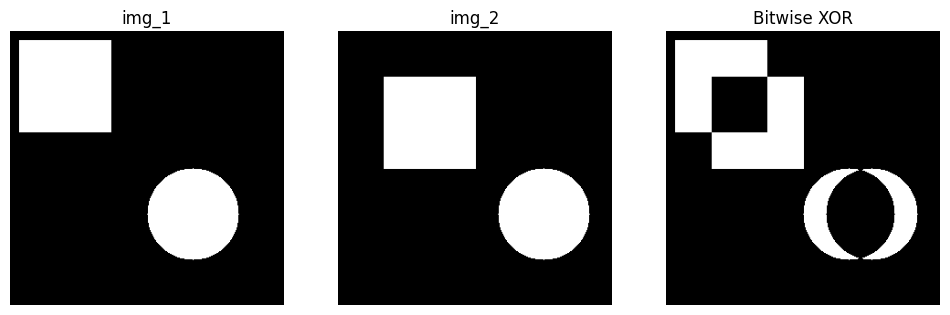

In [58]:
bitwise_xor = cv2.bitwise_xor(img_1, img_2)

# Exibindo as imagens
plt.figure(figsize=(12, 5))

plt.subplot(1, 3, 1)
plt.imshow(img_1, cmap='gray')
plt.title('img_1')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(img_2, cmap='gray')
plt.title('img_2')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(bitwise_xor, cmap='gray')
plt.title('Bitwise XOR')
plt.axis('off')

plt.show()

### Bitwise NOT (`cv2.bitwise_not(img_1)`)

* Inverte os bits da imagem: trasforma pixels brancos (255) em pretos (0) e vice-versa. 
* Útil para inverter máscaras binárias.


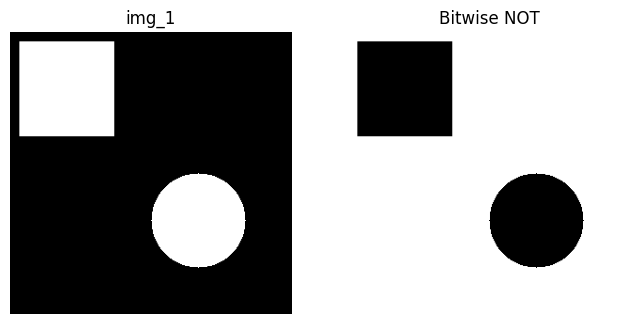

In [59]:
bitwise_not = cv2.bitwise_not(img_1)

# Exibindo as imagens
plt.figure(figsize=(8, 5))

plt.subplot(1, 2, 1)
plt.imshow(img_1, cmap='gray')
plt.title('img_1')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(bitwise_not, cmap='gray')
plt.title('Bitwise NOT')
plt.axis('off')

plt.show()

### Operações bit a bit com imagens coloridas

In [61]:
# Carregando a imagem
image_path = os.path.join(PATH_DIR, 'imagem', 'imagem_folha.jpg')
image = cv2.imread(image_path)
image = cv2.resize(image, (300, 300))
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Crinado uma imagem com um círculo branco:
img_3 = np.zeros((300, 300), dtype="uint8")
cv2.circle(img_3, (150, 150), 100, (255, 255, 255), -1)

# Bitwise AND com máscara img_3
bitwise_and_example = cv2.bitwise_and(image, image, mask=img_3)

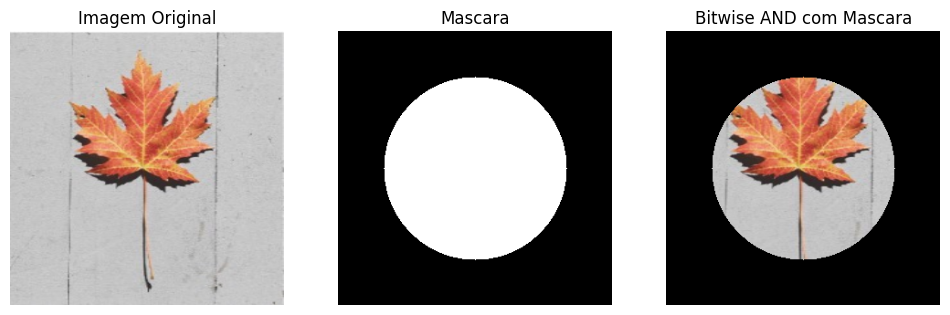

In [62]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 3, 1)
plt.imshow(image)
plt.title('Imagem Original')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(img_3, cmap='gray')
plt.title('Mascara')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(bitwise_and_example)
plt.title('Bitwise AND com Mascara')
plt.axis('off')

plt.show()

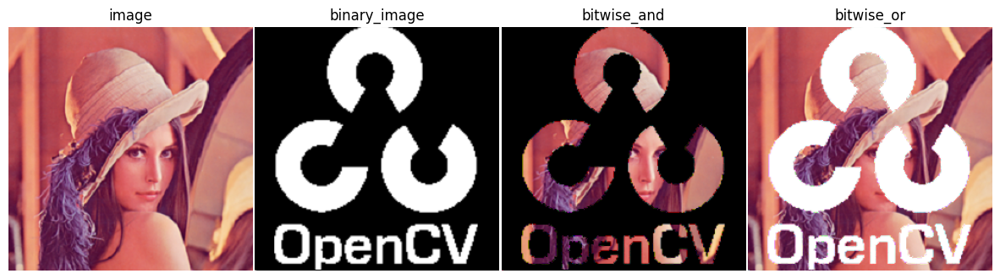

In [ ]:
# Paths das imagens
image_path = os.path.join(PATH_DIR, 'imagem', 'lenna_250.png')
binary_image_path = os.path.join(PATH_DIR, 'imagem', 'opencv_binary_logo_250.png')

# Carregando as imagens
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

binary_image = cv2.imread(binary_image_path)

# Operações Bitwise
bitwise_and = cv2.bitwise_and(image, binary_image)
bitwise_or = cv2.bitwise_or(image, binary_image)

# Exibindo as imagens
plt.figure(figsize=(15, 5))

plt.subplot(1, 4, 1)
plt.imshow(image)
plt.title('image')
plt.axis('off')

plt.subplot(1, 4, 2)
plt.imshow(binary_image)
plt.title('binary_image')
plt.axis('off')

plt.subplot(1, 4, 3)
plt.imshow(bitwise_and)
plt.title('bitwise_and')
plt.axis('off')

plt.subplot(1, 4, 4)
plt.imshow(bitwise_or)
plt.title('bitwise_or')
plt.axis('off')

plt.subplots_adjust(wspace=0.01, hspace=0.2)

plt.show()

# Filtros e Suavização de Imagens

## Conceito de Kernels e Operação de Filtragem

Um kernel, também chamado de filtro ou máscara, é uma pequena matriz de valores numéricos que é aplicada sobre uma imagem para modificar seus pixels de acordo com um determinado efeito.

A aplicação de um kernel a uma imagem é feita por um processo chamado convolução.

**Passos da Convolução**

1️⃣ O kernel percorre a imagem pixel a pixel.

2️⃣ Para cada posição, os valores do kernel são multiplicados pelos valores dos pixels vizinhos correspondentes.

3️⃣ Os produtos são somados e o resultado é armazenado no pixel central da nova imagem.

4️⃣ O processo se repete até toda a imagem ser processada.

💡 A convolução é a base de operações como borramento, realce de bordas e detecção de padrões.

## Tipos de kernels e seus efeitos

Diferentes kernels produzem diferentes efeitos na imagem: 

| Tipo de kernel | Efeito | Método no OpenCV |
| -------- | ------- | --------- |
| Média (Blur) | Suaviza a imagem, reduzindo ruídos | `cv2.blur()` ou `cv2.boxFilter()` |
| Gaussiano | Suavização mais suave e natural | `cv2.GaussianBlur()` |
| Mediana | Remove ruídos do tipo “sal e pimenta” | `cv2.medianBlur()` |
| Bilateral | Reduz ruídos preservando as bordas | `cv2.bilateralFilter()` |
| Detecção de Bordas | Realça bordas e detalhes na imagem | `cv2.Laplacian()`, `cv2.Sobel()`, `cv2.Canny()` |
| Realce (Sharpening) | Aumentar a nitidez | `cv2.Filter2D()` com um kernel de nitidez |


## Aplicação de kernels arbitrários

A função cv2.filter2D() permite aplicar um kernel (ou filtro) personalizado à imagem, utilizando a operação de convolução.

A convolução consiste em percorrer a imagem pixel a pixel, aplicando uma máscara (kernel) sobre os valores vizinhos e computando um novo valor para o pixel central.

**Exemplo: Aplicação do kernel de média 5x5**

```python
kernel = np.ones((5, 5), np.float32) / 25
img_result = cv2.filter2D(img, -1, kernel)
```

* O que esse kernel faz?
    * Esse kernel de média substitui cada pixel pela média dos 25 pixels ao seu redor (matriz 5×5), resultando em um efeito de suavização.


In [70]:
# img_path = os.path.join(PATH_DIR, 'imagem', 'imagem_mao_e_bola_tenis.jpg')
img_path = os.path.join(PATH_DIR, 'imagem', 'lenna_250.png')

img = cv2.imread(img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

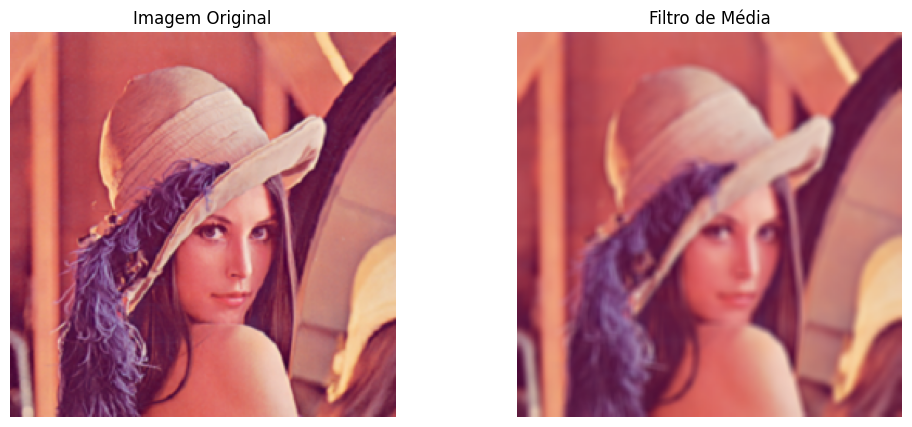

In [71]:
kernel = np.ones((5, 5), np.float32) / 25
img_media = cv2.filter2D(img, -1, kernel)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title('Imagem Original')
plt.axis('off')
plt.subplot(1, 2, 2)
plt.imshow(img_media)
plt.title('Filtro de Média')
plt.axis('off')
plt.show()

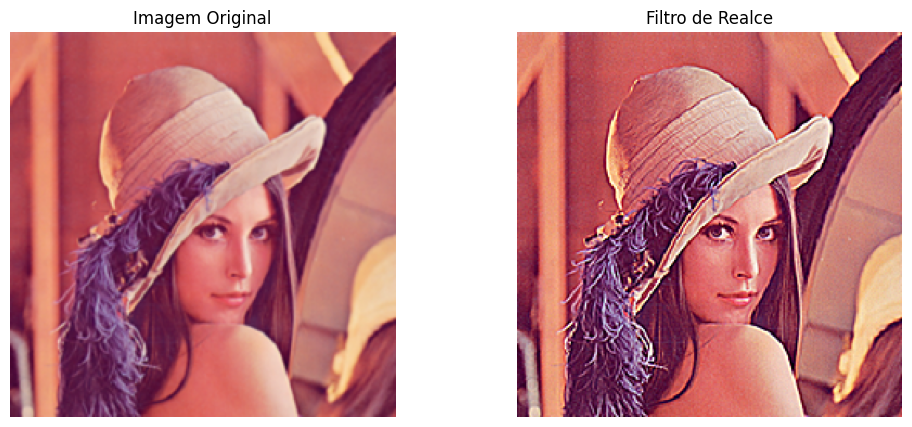

In [ ]:
# kernel para realce de bordas
kernel = np.array([[0, -1, 0],
                   [-1, 5, -1],
                   [0, -1, 0]])
# aplicando o filtro de realce
img_realce = cv2.filter2D(img, -1, kernel)

# exibindo a imagem original e a imagem com o filtro de realce
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title('Imagem Original')
plt.axis('off')
plt.subplot(1, 2, 2)
plt.imshow(img_realce)
plt.title('Filtro de Realce')
plt.axis('off')
plt.show()

## Filtro da Média (Avering Filter)

A filtragem por média é realizada aplicando um kernel de média sobre a imagem. Esse processo reduz variações bruscas de intensidade, suavizando a imagem e removendo ruídos.

No OpenCV utiliza-se as funções cv2.blur() e cv2.boxFilter(). Ambas as funções aplicam a média dos pixels dentro de uma janela (kernel) ao redor de cada pixel. Sendo que o pixel central da janela é atualizado com o valor médio

* `cv2.blur()`: Sempre usa um kernel normalizado (a soma dos elementos do kernel é igual a 1)
* `cv2.boxFilter()`: Pode ser usado com um kernel normalizado ou não (quando normalize=False)

**Parâmetros Importantes:**

* Tamanho do kernel (ksize):
    * Define a área sobre o qual a média será calculada
    * Um kernel maior resulta em um borramento mais intenso
* Âncor (anchor)
    * Define o ponto de referência do kernel ao aplicar a convolução
    * O padrão (-1,-1) posiciona a âncora no centro do kernel.



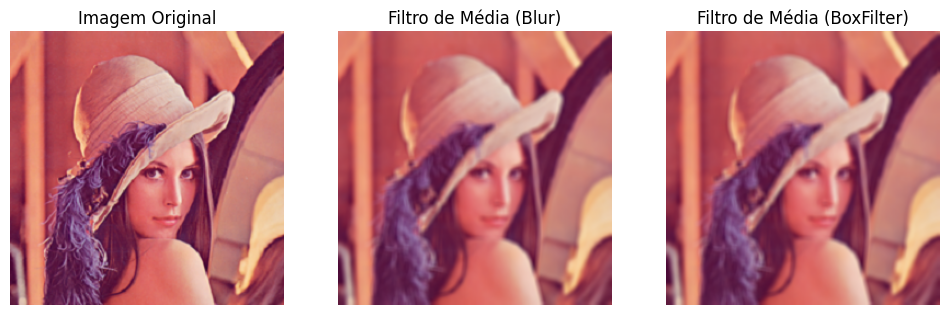

In [79]:
img_path = os.path.join(PATH_DIR, 'imagem', 'lenna_250.png')
img = cv2.imread(img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

img_blur = cv2.blur(img, ksize=(5, 5))
img_boxfilter = cv2.boxFilter(img, -1, ksize=(5, 5), normalize=True)

plt.figure(figsize=(12, 5))
plt.subplot(1, 3, 1)
plt.imshow(img)
plt.title('Imagem Original')
plt.axis('off')
plt.subplot(1, 3, 2)
plt.imshow(img_blur)
plt.title('Filtro de Média (Blur)')
plt.axis('off')
plt.subplot(1, 3, 3)
plt.imshow(img_boxfilter)
plt.title('Filtro de Média (BoxFilter)')
plt.axis('off')
plt.show()

In [80]:
img_blur[100, 100], img_boxfilter[100, 100]

(array([117,  49,  98], dtype=uint8), array([117,  49,  98], dtype=uint8))

In [83]:
np.all(img_blur == img_boxfilter)

np.True_

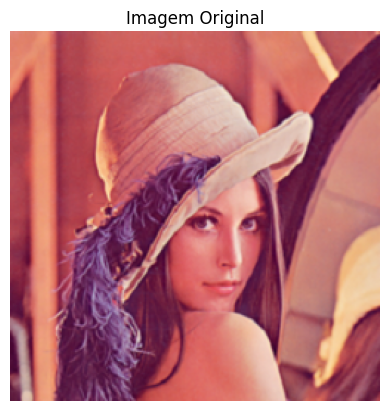

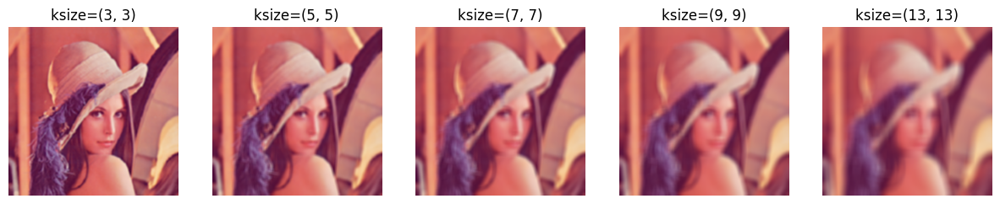

In [86]:
img_path = os.path.join(PATH_DIR, 'imagem', 'lenna_250.png')
img = cv2.imread(img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.imshow(img)
plt.title('Imagem Original')
plt.axis('off')
plt.show()

fig, ax = plt.subplots(1, 5, figsize=(15, 8))
for i, size in enumerate([3, 5, 7, 9, 13]):
    ax[i].imshow(cv2.blur(img, ksize=(size, size)))
    ax[i].set_title(f'ksize=({size}, {size})')
    ax[i].axis('off')
plt.show()

## Filtro Gaussiano

Diferente do filtro de média simples, o filtro Gaussiano (`cv2.GaussianBlur()`) usa uma matriz gerada por uma função Gaussiana (distribuição normal). Isso faz com que os pixels mais próximos do centro tenham mais peso na média do que os mais distantes, resultando em um efeito mais natural.


**Parâmetros Importantes:**

* Tamanho do kernel (ksize):
    * Deve ser ímpar e positivo (ex.: 3x3, 5x5, 7x7)
    * Define a área de influência da suavização.
* Desvios Padrão (sigmaX e sigmaY) 
    * sigmaX: Controla a dispersão do filtro na direção X.
    * sigmaY: Controla a dispersão na direção Y.
    * Se apenas sigmaX for especificado, sigmaY assumirá o mesmo valor.
    * Se ambos forem zero (0,0), os valores serão calculados automaticamente com base no tamanho do kernel.

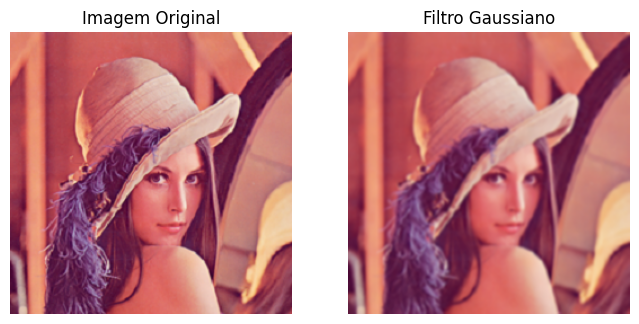

In [84]:
img_path = os.path.join(PATH_DIR, 'imagem', 'lenna_250.png')
img = cv2.imread(img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

img_gaussian = cv2.GaussianBlur(img, (5, 5), 0)

plt.figure(figsize=(8, 5))
plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title('Imagem Original')
plt.axis('off')
plt.subplot(1, 2, 2)
plt.imshow(img_gaussian)
plt.title('Filtro Gaussiano')
plt.axis('off')
plt.show()

## Filtro da Mediana (Median Filtering)

O filtro da mediana (`cv2.medianBlur()`) funciona de maneira diferente: ele substitui o pixel central pela mediana dos valores dos vizinhos. Isso faz com que seja extremamente eficaz para remover ruídos do tipo "sal e pimenta" (pixels muito claros ou escuros).

**Quando usar o filtro da mediana?**

* Para remover ruído “sal e pimenta”
* Quanto quiser manter bordas mais preservadas do que no filtro de média

**Obs.:** O tamanho do kernel deve ser ímpar e maior que 1.


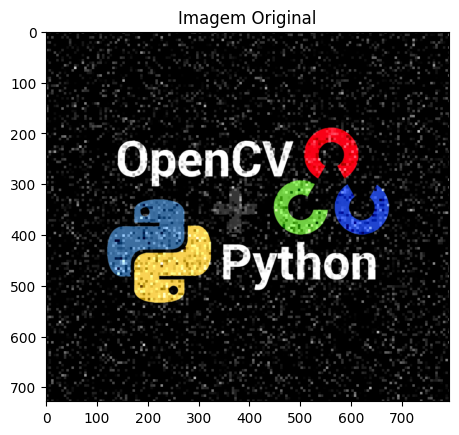

In [127]:
img_path = os.path.join(PATH_DIR, 'imagem', 'logo_opencv_e_python_sparse_noise.png')
img = cv2.imread(img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.imshow(img)
plt.title('Imagem Original')
plt.show()

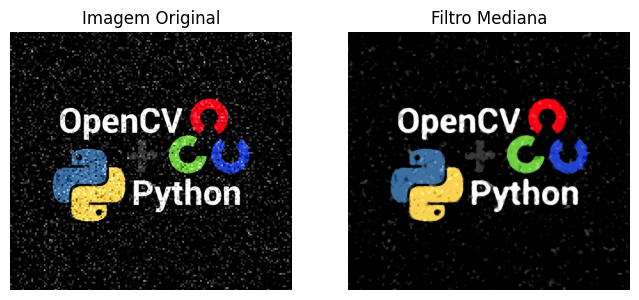

In [ ]:
img_median_blur = cv2.medianBlur(img, ksize=9)

plt.figure(figsize=(8, 5))
plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title('Imagem Original')
plt.axis('off')
plt.subplot(1, 2, 2)
plt.imshow(img_median_blur)
plt.title('Filtro Mediana')
plt.axis('off')
plt.show()

## Filtro Bilateral (Bilateral Filtering)

Os filtros anteriores borram a imagem inteira, inclusive as bordas. O filtro bilateral (`cv2.bilateralFilter()`) resolve esse problema ao aplicar um peso maior para pixels próximos e com cores similares, preservando bordas enquanto suaviza outras regiões.

**A Filtragem Bilateral usa dois filtros gaussianos**

* Filtro Gaussiano Espacial: Considera apenas pixels próximos ao ponto central
* Filtro Gaussiano baseado na diferença de intensidade: Dá mais peso a pixels com intensidade semelhantes ao pixel central, garantindo que bordas sejam preservadas.

**Parâmetros da função**

* `d`: Tamanho da vizinhança para considerar na filtragem.
* `sigmaColor`: Controla a influência da diferença de intensidade. Valores maiores resultam em uma filtragem mais forte entre pixels com diferenças de intensidade maiores.
* `sigmaSpace`: Define o alcance da vizinhança espacial. Quanto maior, mais pixels ao redor do ponto central serão considerados a filtragem.

**Exemplo:**
```python
smooth_image_bf = cv2.bilateralFilter(img, d=5, sigmaColor=10, sigmaScape=10)
```


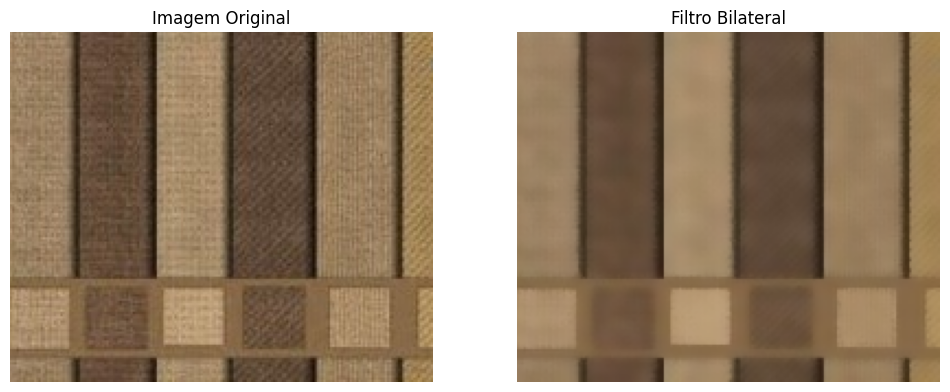

In [129]:
# Lendo a imagem
img_path = os.path.join(PATH_DIR, 'imagem', 'bilateral.jpg')
img = cv2.imread(img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Filtro Bilateral
img_bilateral = cv2.bilateralFilter(img, d=9, sigmaColor=75, sigmaSpace=75)

# exibindo a imagem original e a imagem com o filtro bilateral
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title('Imagem Original')
plt.axis('off')
plt.subplot(1, 2, 2)
plt.imshow(img_bilateral)
plt.title('Filtro Bilateral')
plt.axis('off')
plt.show()

# Realce de Bordas

Vimos filtros para tratamento de ruído em imagens. Porém, o procedimento de filtragem em imagens possui duas outras aplicações tão importantes quanto o tratamento de ruído: **extração de características, e realce de arestas, bordas ou contornos em imagens**.

## Operador Sobel

* Filtro não linear para realce de contornos, destacando linhas verticais e horizontais.
* A filtragem pode ser feita na direção horizontal ou vertical.
* Produz bordas mais grossas comparadas a outros métodos. 
* Implementado na OpenCV através da função cv2.Sobel(). 
* Parâmetros principais:
    * cv2.CV_8U: define o tipo de variável para armazenar os pixels.
    * Direção da filtragem: (dx=1, dy=0) para horizontal, (dx=0, dy=1) para vertical.
    * ksize: tamanho da máscara de filtragem.



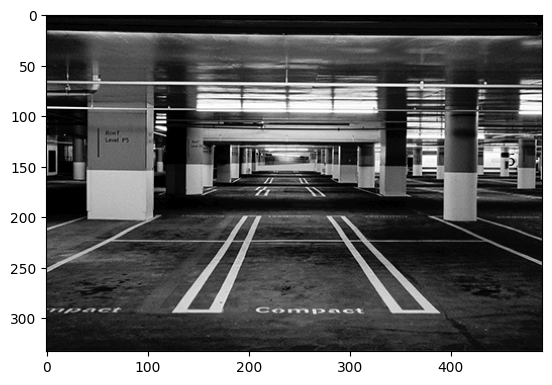

In [131]:
img_path = os.path.join(PATH_DIR, 'imagem', 'estacionamento.png')
img = cv2.imread(img_path, 0)

plt.imshow(img, cmap='gray')
plt.show()

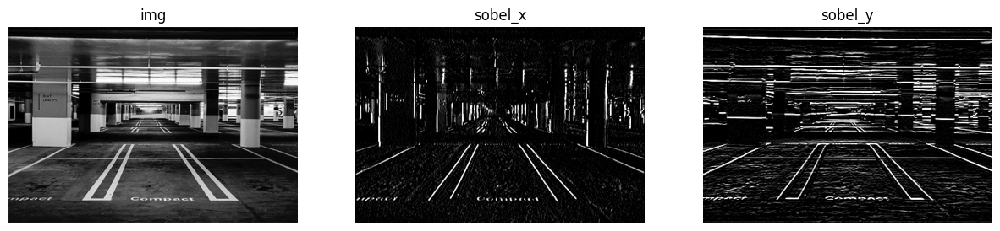

In [132]:
# Sobel X
sobel_x = cv2.Sobel(img, cv2.CV_8U, 1, 0, ksize=3)
# Sobel Y
sobel_y = cv2.Sobel(img, cv2.CV_8U, 0, 1, ksize=3)

# Exibindo as imagens
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(img, cmap='gray')
plt.title('img')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(sobel_x, cmap='gray')
plt.title('sobel_x')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(sobel_y, cmap='gray')
plt.title('sobel_y')
plt.axis('off')

plt.show()

## Operador Laplaciano

* Filtro não linear para realce de contornos, destacando linhas verticais e horizontais.
* Popular para realce de bordas, utilizando uma máscara de ordem 3.
* Calcula a média ponderada dos pixels vizinhos e eleva ao quadrado.
* Produz bordas mais finas do que o Sobel, mas é altamente sensível a ruído.
* Implementado na OpenCV através da função `cv2.Laplacian()`.
* Aplicação comum de filtro passa-baixas (ex: gaussiano) antes do laplaciano para reduzir ruídos.


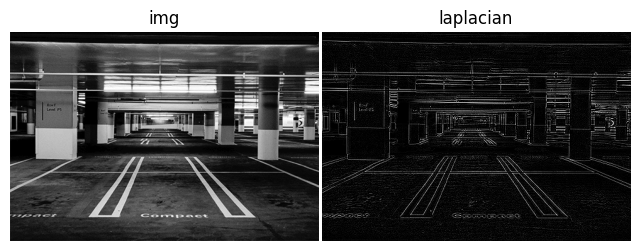

In [139]:
laplacian = cv2.Laplacian(img, cv2.CV_8U)

plt.figure(figsize=(8, 5))

plt.subplot(1, 2, 1)
plt.imshow(img, cmap='gray')
plt.title('img')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(laplacian, cmap='gray')
plt.title('laplacian')
plt.axis('off')

plt.subplots_adjust(wspace=0.01, hspace=0.2)

plt.show()

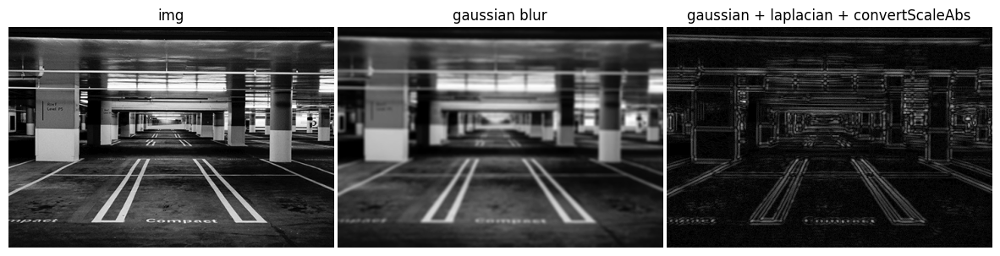

In [141]:
img_gaussian = cv2.GaussianBlur(img, (7, 7), 2)

laplacian_image  = cv2.Laplacian(img_gaussian, cv2.CV_64F)
laplacian_image  = cv2.convertScaleAbs(laplacian_image)

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(img, cmap='gray')
plt.title('img')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(img_gaussian, cmap='gray')
plt.title('gaussian blur')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(laplacian_image, cmap='gray')
plt.title('gaussian + laplacian + convertScaleAbs')
plt.axis('off')

plt.subplots_adjust(wspace=0.01, hspace=0.2)
plt.show()

## Aguçamento de bordas

* Feito pela subtração da imagem original com sua versão processada pelo Laplaciano.
* Realça detalhes finos, podendo gerar pixels negativos.
* Para evitar pixels negativos, utiliza-se `cv2.subtract()`, que trata esses valores automaticamente


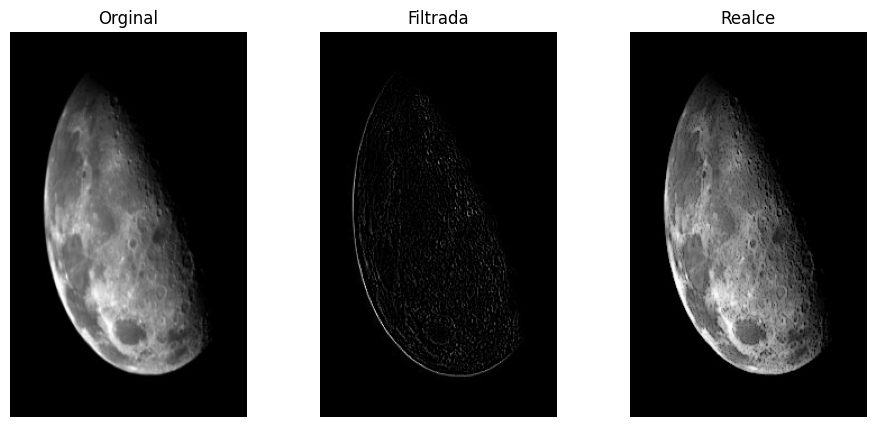

In [143]:
# Caminho da imagem
img_path = os.path.join(PATH_DIR, 'imagem', 'lua.jpg')

# Lendo a imagem
img_original = cv2.imread(img_path, 0)

# Aplicando o filtro de Laplaciano
img_filtrada = cv2.Laplacian(img_original, cv2.CV_8U)

# Operação de subtração
img_realce = cv2.subtract(img_original, img_filtrada)

# Exibindo as imagens
plt.figure(figsize=(12, 5))

plt.subplot(1, 3, 1)
plt.imshow(img_original, cmap='gray')
plt.title('Orginal')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(img_filtrada, cmap='gray')
plt.title('Filtrada')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(img_realce, cmap='gray')
plt.title('Realce')
plt.axis('off')

plt.subplots_adjust(wspace=0.0, hspace=0.01)
plt.show()

## Filtro Máscara de Desaguçamento

* Técnica baseada na subtração da imagem original por uma versão suavizada dela mesma.
* A suavização é realizada por um filtro passa-baixas (ex: Gaussiano).
* Após a subtração, a imagem com bordas realçadas é somada à original.
* Implementado na OpenCV utilizando `cv2.GaussianBlur()`, `cv2.subtract()` e `cv2.add()`.

In [145]:
# Caminho da imagem
img_path = os.path.join(PATH_DIR, 'imagem', 'radiografia.jpg')

# Lendo a imagem
img_original = cv2.imread(img_path, 0)

# Aplicando o filtro de Gaussiano
img_suavizada = cv2.GaussianBlur(img_original, (13, 13), 3)

# Operação de subtração e multiplicação
img_detalhes = cv2.multiply(cv2.subtract(img_original, img_suavizada), 3)

# Operação de adição 
img_realcada = cv2.add(img_original, img_detalhes)

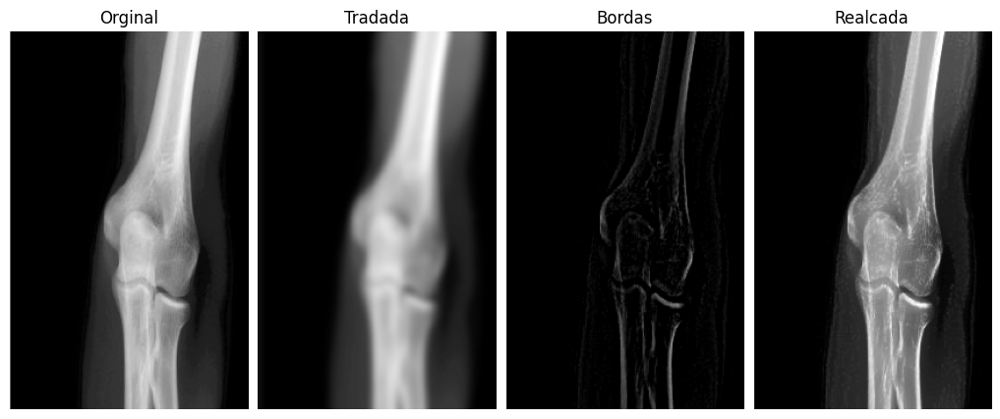

In [150]:
plt.figure(figsize=(13, 5))

plt.subplot(1, 4, 1)
plt.imshow(img_original, cmap='gray')
plt.title('Orginal')
plt.axis('off')

plt.subplot(1, 4, 2)
plt.imshow(img_suavizada, cmap='gray')
plt.title('Tradada')
plt.axis('off')

plt.subplot(1, 4, 3)
plt.imshow(img_detalhes, cmap='gray')
plt.title('Bordas')
plt.axis('off')

plt.subplot(1, 4, 4)
plt.imshow(img_realcada, cmap='gray')
plt.title('Realcada')
plt.axis('off')

plt.subplots_adjust(wspace=0.0, hspace=0.01)
plt.show()

## Detector de Bordas Canny

* Um dos mais eficientes métodos para detecção de bordas.
* Desenvolvido por John Canny, baseado em três princípios:
    * Detectar todas as bordas possíveis.
    * Manter as bordas próximas às reais.
    * Evitar a criação de bordas falsas.
* Utiliza filtro gaussiano e operador de Sobel.
* Implementado na OpenCV com a função `cv2.Canny()`, que requer:
    * Imagem em tons de cinza.
    * Dois limiares para controle da intensidade de detecção.
    * Valores mais altos nos limiares resultam em menos bordas detectadas.


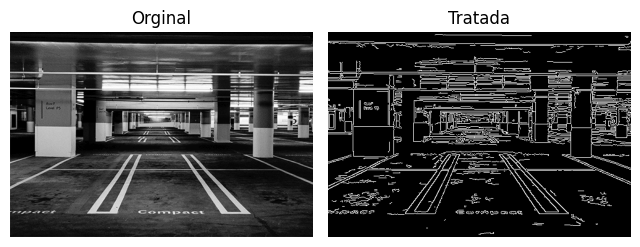

In [151]:
# Caminho da imagem
img_path = os.path.join(PATH_DIR, 'imagem', 'estacionamento.png')

# Lendo a imagem
img_original = cv2.imread(img_path, 0)

# Aplicando o filtro de Canny
img_tratada = cv2.Canny(img_original, 100, 200)

# Exibindo as imagens
plt.figure(figsize=(8, 5))

plt.subplot(1,2,1)
plt.imshow(img_original, cmap='gray')
plt.title('Orginal')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(img_tratada, cmap='gray')
plt.title('Tratada')
plt.axis('off')

plt.subplots_adjust(wspace=0.05, hspace=0.01)

plt.show()

# Operações morfológicas

* Operações aplicadas principalmente em imagens binárias, baseadas na forma dos objetos presentes na imagem.
* Utilizam um elemento estruturante (kernel) para definir a natureza da transformação.
* As operações básicas são dilatação e erosão.
* Operações derivadas incluem abertura e fechamento.
* Outras transformações utilizam a diferença entre as operações básicas.

## Elemento estruturante

* Esse elemento pode ser visto como uma imagem binária, menor que a imagem original, armazenado geralmente em uma matriz quadrada. Ele é a base para que qualquer operação morfológica seja executada.
* Assim como os filtros espaciais, a matriz que representa o elemento estruturante percorrerá toda a imagem a ser tratada. Nesse processo, uma determinada operação morfológica será realizada pixel a pixel na imagem, alterando o valor de cada um deles para seguir o padrão definido por esse elemento.
* Tipos disponíveis no OpenCV:
    * Retangular (`cv2.MORPH_RECT`) – adequado para estruturas regulares.
    * Elíptico (`cv2.MORPH_ELLIPSE`) – útil para formas arredondadas.
    * Cruz (`cv2.MORPH_CROSS`) – enfatiza conexões em cruz.


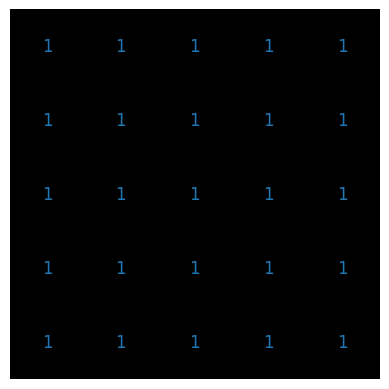

In [ ]:
elementoEstruturante = cv2.getStructuringElement(cv2.MORPH_RECT, (5, 5))

plt.imshow(elementoEstruturante, cmap='gray')
plt.axis('off')

# Adicionando os valores dos pixels na imagem
for i in range(elementoEstruturante.shape[0]):
    for j in range(elementoEstruturante.shape[1]):
        plt.text(j, i, str(elementoEstruturante[i, j]),
                 ha='center', va='center', color='C0', fontsize=12)

plt.show()

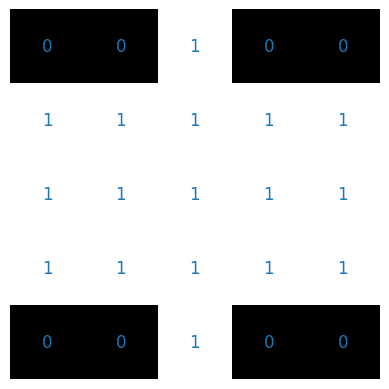

In [ ]:
elementoEstruturante = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))

plt.imshow(elementoEstruturante, cmap='gray')
plt.axis('off')

# Adicionando os valores dos pixels na imagem
for i in range(elementoEstruturante.shape[0]):
    for j in range(elementoEstruturante.shape[1]):
        plt.text(j, i, str(elementoEstruturante[i, j]),
                 ha='center', va='center', color='C0', fontsize=12)

plt.show()

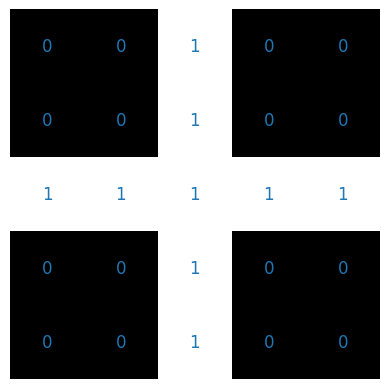

In [ ]:
elementoEstruturante = cv2.getStructuringElement(cv2.MORPH_CROSS, (5, 5))

plt.imshow(elementoEstruturante, cmap='gray')
plt.axis('off')

# Adicionando os valores dos pixels na imagem
for i in range(elementoEstruturante.shape[0]):
    for j in range(elementoEstruturante.shape[1]):
        plt.text(j, i, str(elementoEstruturante[i, j]),
                 ha='center', va='center', color='C0', fontsize=12)

plt.show()

In [ ]:
img_path = os.path.join(PATH_DIR, 'imagem', 'circle_binario.jpg')

img = cv2.imread(img_path, 0)

ksize = (7, 7)

kernel1 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, ksize)
img_dilatada1 = cv2.dilate(img, kernel1)

kernel2 = cv2.getStructuringElement(cv2.MORPH_RECT, ksize)
img_dilatada2 = cv2.dilate(img, kernel2)

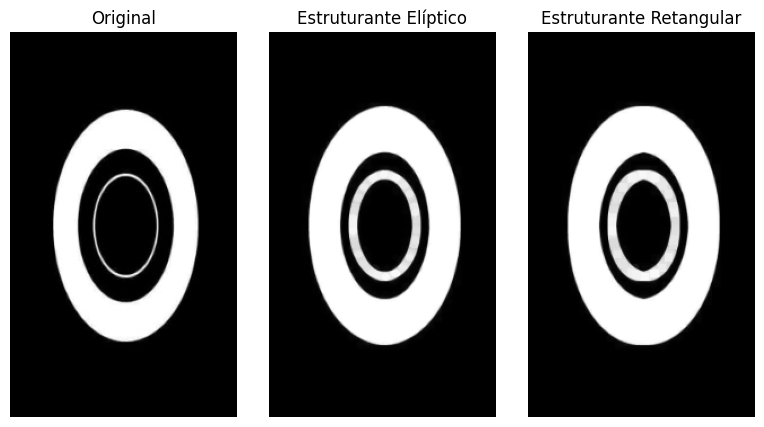

In [153]:
plt.figure(figsize=(10, 5))
plt.subplot(1, 3, 1)
plt.imshow(img, cmap='gray')
plt.title('Original')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(img_dilatada1, cmap='gray')
plt.title('Estruturante Elíptico')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(img_dilatada2, cmap='gray')
plt.title('Estruturante Retangular')
plt.axis('off')

plt.subplots_adjust(wspace=0.01, hspace=0.01)

plt.show()

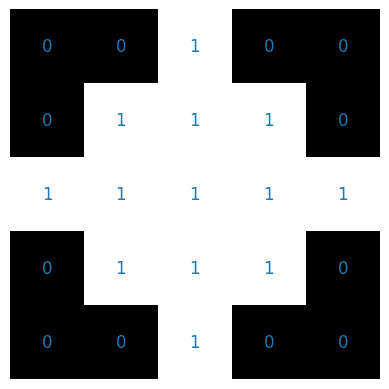

In [154]:
elementoEstruturante = np.matrix([
    [0, 0, 1, 0, 0],
    [0, 1, 1, 1, 0],
    [1, 1, 1, 1, 1],
    [0, 1, 1, 1, 0],
    [0, 0, 1, 0, 0]
], np.uint8)

plt.imshow(elementoEstruturante, cmap='gray')
plt.axis('off')

# Adicionando os valores dos pixels na imagem
for i in range(elementoEstruturante.shape[0]):
    for j in range(elementoEstruturante.shape[1]):
        plt.text(j, i, str(elementoEstruturante[i, j]),
                 ha='center', va='center', color='C0', fontsize=12)

plt.show()

## Erosão 

* Reduz as regiões de primeiro plano (foreground) da imagem.
* Objetos diminuem de tamanho, e buracos internos aumentam.

**Exemplo:**
```python
# kernel
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5,5))
# operação de erosão
img_processada = cv2.erode(img, kernel, iterations=2)
```

In [155]:
arr = np.zeros((6,6), np.uint8)
arr[1:5, 1:4] = 1
arr[2:4, 4] = 1

kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3,1))

erode = cv2.erode(arr, kernel)
# arr
# plt.imshow(arr, cmap='gray')
# plt.axis('off')

# plt.show()

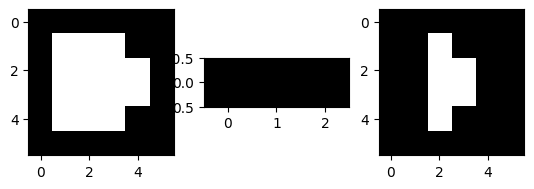

In [156]:
plt.subplot(1, 3, 1)
plt.imshow(arr, cmap='gray')
# plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(kernel, cmap='gray')
# plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(erode, cmap='gray')
# plt.axis('off')

plt.show()

In [157]:
img_path = os.path.join(PATH_DIR, 'imagem', 'circle_binario.jpg')

img = cv2.imread(img_path, 0)

kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5,5))
img_processada = cv2.erode(img, kernel, iterations=2)

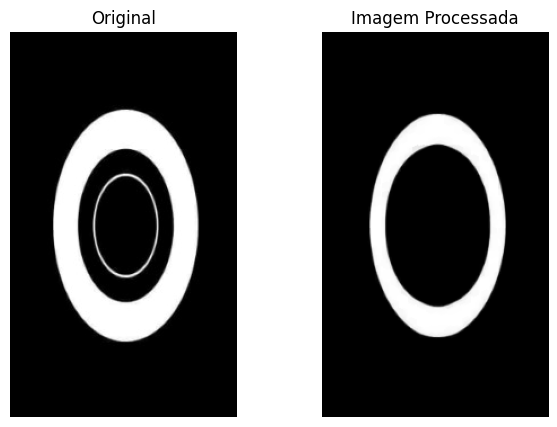

In [158]:
plt.figure(figsize=(8, 5))
plt.subplot(1, 2, 1)
plt.imshow(img, cmap='gray')
plt.title('Original')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(img_processada, cmap='gray')
plt.title('Imagem Processada')
plt.axis('off')

plt.subplots_adjust(wspace=0.01, hspace=0.01)

plt.show()

## Dilatação 

* Expande as regiões de primeiro plano (foreground) da imagem.
* Aumenta o tamanho dos objetos enquanto reduz buracos internos

**Exemplo:**
```python
# kernel
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5,5))
# operação de dilatação
img_processada = cv2.dilate(img, kernel, iterations=2)
```


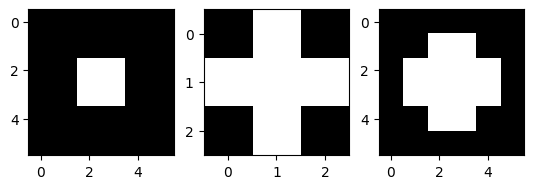

In [159]:
arr = np.zeros((6,6), np.uint8)
arr[2:4, 2:4] = 1

kernel = cv2.getStructuringElement(cv2.MORPH_CROSS, (3,3))

dilate = cv2.dilate(arr, kernel)

plt.subplot(1, 3, 1)
plt.imshow(arr, cmap='gray')
# plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(kernel, cmap='gray')
# plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(dilate, cmap='gray')
# plt.axis('off')

plt.show()

In [162]:
# Caminho da imagem
img_path = os.path.join(PATH_DIR, 'imagem', 'circle_binario.jpg')

# Lendo a imagem
img = cv2.imread(img_path, 0)

# kernel
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5,5))

# aplicando a dilatação
img_processada = cv2.dilate(img, kernel, iterations=2)

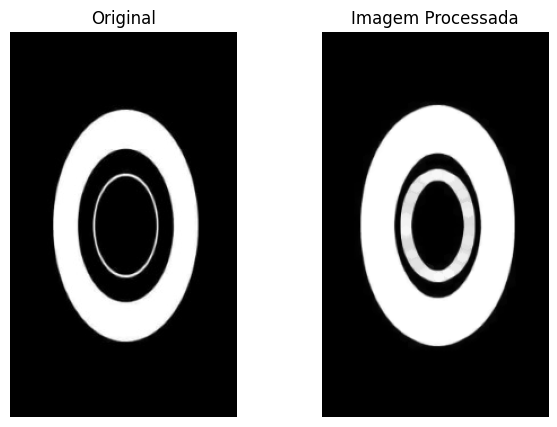

In [163]:
plt.figure(figsize=(8, 5))
plt.subplot(1, 2, 1)
plt.imshow(img, cmap='gray')
plt.title('Original')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(img_processada, cmap='gray')
plt.title('Imagem Processada')
plt.axis('off')

plt.subplots_adjust(wspace=0.01, hspace=0.01)

plt.show()

## Abertura 

* Consiste em erosão seguida de dilatação.
* Remove ruídos pequenos como salt-and-pepper noise.

**Exemplo:**
```python
# kernel
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5,5))
# operação de dilatação
img_processada = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel)
```


In [164]:
# Caminho da imagem
img_path = os.path.join(PATH_DIR, 'imagem', 'circle_binario_ruido_1.png')

# Lendo a imagem
img = cv2.imread(img_path, 0)

# kernel
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))

# aplicando operador de abertura
img_processada = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel)

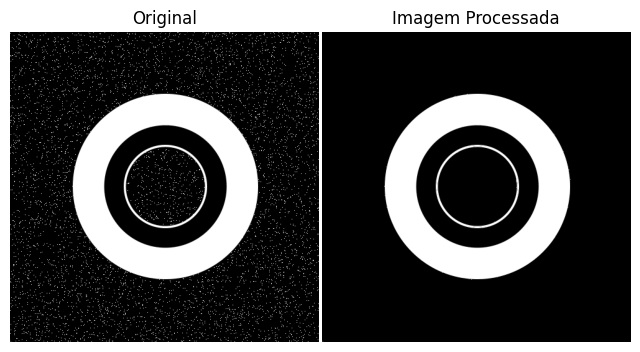

In [165]:
plt.figure(figsize=(8, 5))
plt.subplot(1, 2, 1)
plt.imshow(img, cmap='gray')
plt.title('Original')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(img_processada, cmap='gray')
plt.title('Imagem Processada')
plt.axis('off')

plt.subplots_adjust(wspace=0.01, hspace=0.01)

plt.show()

## Fechamento

* Consiste em dilatação seguida de erosão.
* Preenche pequenos buracos na imagem.

**Exemplo:**
```python
# kernel
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5,5))
# operação de dilatação
img_processada = cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel)
```


In [166]:
# caminho da imagem
img_path = os.path.join(PATH_DIR, 'imagem', 'circle_binario_ruido_2.png')

# lendo a imagem
img = cv2.imread(img_path, 0)

# kernel
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5,5))

# aplicando operador de fechamento
img_processada = cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel)

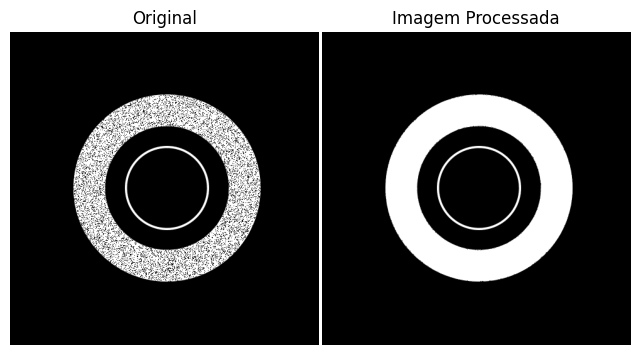

In [167]:
plt.figure(figsize=(8, 5))
plt.subplot(1, 2, 1)
plt.imshow(img, cmap='gray')
plt.title('Original')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(img_processada, cmap='gray')
plt.title('Imagem Processada')
plt.axis('off')

plt.subplots_adjust(wspace=0.01, hspace=0.01)

plt.show()

## Abertura e fechamento em tons de cinza

In [ ]:
img = cv2.imread("arroz.png", 0)
kernel = cv2.getStructuringElement(cv2.MORPH_CROSS, (5,5))
img_processada = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel)

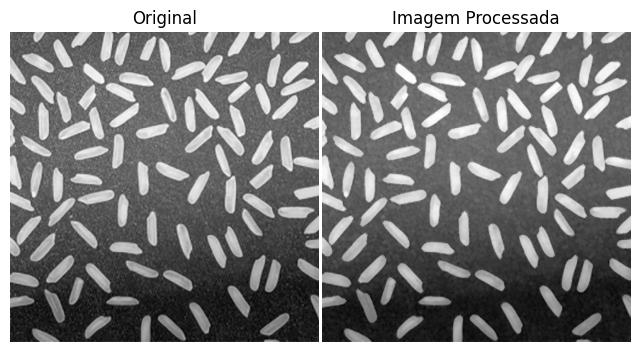

In [ ]:
plt.figure(figsize=(8, 5))
plt.subplot(1, 2, 1)
plt.imshow(img, cmap='gray')
plt.title('Original')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(img_processada, cmap='gray')
plt.title('Imagem Processada')
plt.axis('off')

plt.subplots_adjust(wspace=0.01, hspace=0.01)

plt.show()

In [ ]:
kernel = cv2.getStructuringElement(cv2.MORPH_CROSS, (100,100))
img_processada = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel)
img_subtraida = cv2.subtract(img, img_processada)
img_tratada = cv2.add(img_subtraida, img_subtraida)

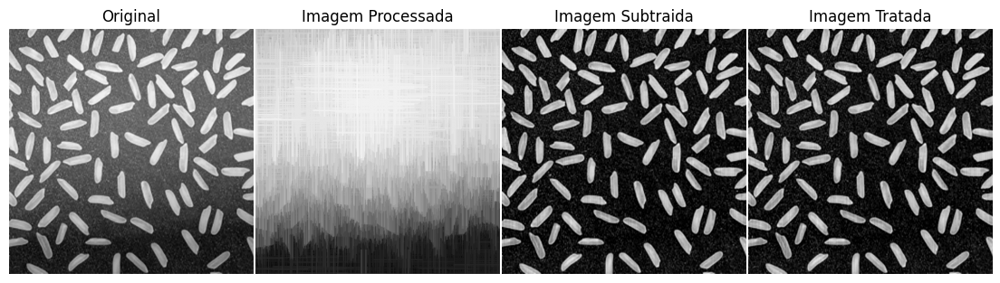

In [ ]:
plt.figure(figsize=(14, 5))
plt.subplot(1, 4, 1)
plt.imshow(img, cmap='gray')
plt.title('Original')
plt.axis('off')

plt.subplot(1, 4, 2)
plt.imshow(img_processada, cmap='gray')
plt.title('Imagem Processada')
plt.axis('off')

plt.subplot(1, 4, 3)
plt.imshow(img_subtraida, cmap='gray')
plt.title('Imagem Subtraida')
plt.axis('off')

plt.subplot(1, 4, 4)
plt.imshow(img_tratada, cmap='gray')
plt.title('Imagem Tratada')
plt.axis('off')

plt.subplots_adjust(wspace=0.01, hspace=0.01)

plt.show()

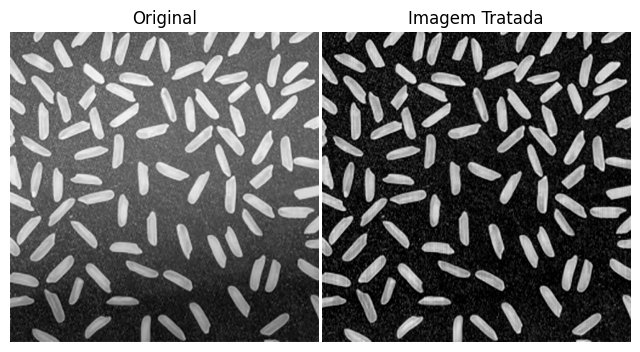

In [ ]:
plt.figure(figsize=(8, 5))
plt.subplot(1, 2, 1)
plt.imshow(img, cmap='gray')
plt.title('Original')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(img_tratada, cmap='gray')
plt.title('Imagem Tratada')
plt.axis('off')

plt.subplots_adjust(wspace=0.01, hspace=0.01)

plt.show()

## Gradiente morfológico

* Diferença entre dilatação e erosão da imagem original.
* Destaca bordas e contornos de objetos na imagem.

**Exemplo:**
```python
# kernel
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5,5))
# gradiente morfológico
img_processada = cv2.morphologyEx(img, cv2.MORPH_GRADIENT, kernel)
```


In [168]:
# caminho da imagem
img_path = os.path.join(PATH_DIR, 'imagem', 'circle_binario.jpg')

# lendo a imagem
img = cv2.imread(img_path, 0)

# kernel
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))

# aplicando operador de gradiente
img_processada = cv2.morphologyEx(img, cv2.MORPH_GRADIENT, kernel)

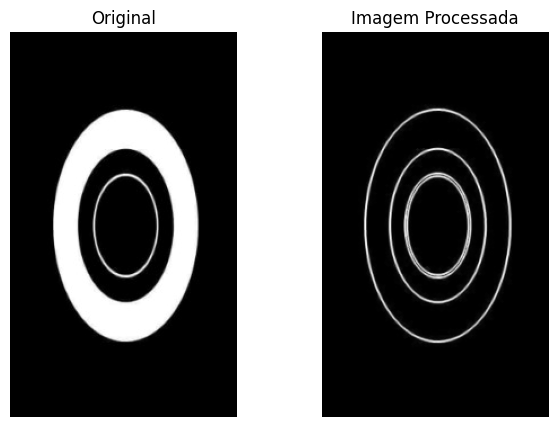

In [169]:
plt.figure(figsize=(8, 5))
plt.subplot(1, 2, 1)
plt.imshow(img, cmap='gray')
plt.title('Original')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(img_processada, cmap='gray')
plt.title('Imagem Processada')
plt.axis('off')

plt.subplots_adjust(wspace=0.01, hspace=0.01)

plt.show()

## TopHat

* Diferença entre a imagem original e sua abertura.
* Realça detalhes brilhantes em fundos escuros.

**Exemplo:**
```python
# kernel
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5,5))
# operação de dilatação
img_processada = cv2.morphologyEx(img, cv2.MORPH_TOPHAT, kernel)
```

In [170]:
# caminho da imagem
img_path = os.path.join(PATH_DIR, 'imagem', 'arroz.png')

# lendo a imagem
img = cv2.imread(img_path, 0)

# kernel
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (25,25))

# aplicando operador de top hat
img_processada = cv2.morphologyEx(img, cv2.MORPH_TOPHAT, kernel)

# ajuste de contraste
img_tratada = cv2.add(img_processada, img_processada)

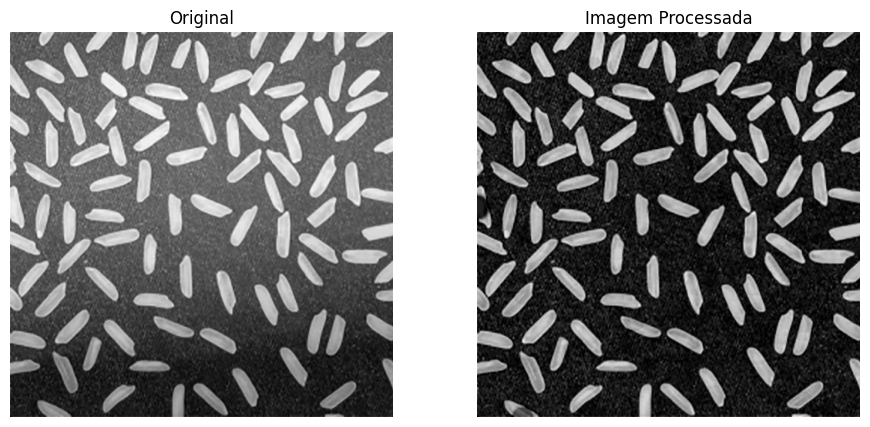

In [171]:
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(img, cmap='gray')
plt.title('Original')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(img_processada, cmap='gray')
plt.title('Imagem Processada')
plt.axis('off')

plt.subplots_adjust(wspace=0.01, hspace=0.01)

plt.show()

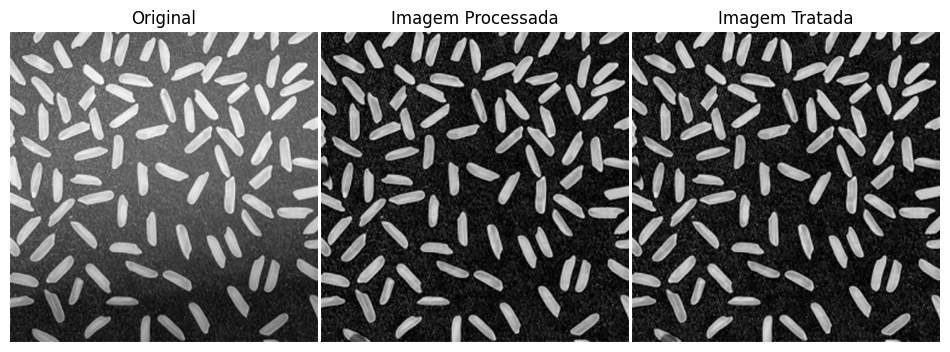

In [172]:
plt.figure(figsize=(12, 5))
plt.subplot(1, 3, 1)
plt.imshow(img, cmap='gray')
plt.title('Original')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(img_processada, cmap='gray')
plt.title('Imagem Processada')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(img_tratada, cmap='gray')
plt.title('Imagem Tratada')
plt.axis('off')

plt.subplots_adjust(wspace=0.01, hspace=0.01)

plt.show()

In [173]:
# caminho da imagem
img_path = os.path.join(PATH_DIR, 'imagem', 'galaxia.png')

# lendo a imagem
img = cv2.imread(img_path, 0)

# kernel
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5,5))

# aplicando operador de top hat
img_processada = cv2.morphologyEx(img, cv2.MORPH_TOPHAT, kernel)

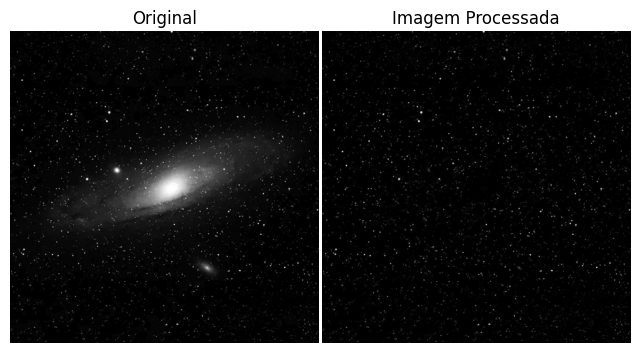

In [174]:
plt.figure(figsize=(8, 5))
plt.subplot(1, 2, 1)
plt.imshow(img, cmap='gray')
plt.title('Original')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(img_processada, cmap='gray')
plt.title('Imagem Processada')
plt.axis('off')

plt.subplots_adjust(wspace=0.01, hspace=0.01)

plt.show()